Importing the necessary packages and libraries

In [1]:
#Importing all the necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
import os
import os.path
from pathlib import Path
import glob

In [4]:
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions

In [5]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras import regularizers
from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization
from keras import models
from keras import layers
import tensorflow as tf
from keras import backend as K
#SKLEARN CLASSIFIER

from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

Path and Label Processes

In [6]:
Fire_Dataset_Path = Path("fire_dataset/Training")

In [7]:
JPG_Path = list(Fire_Dataset_Path.glob(r"*/*.jpg"))

In [9]:
JPG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],JPG_Path))

In [10]:
print("FIRE: ", JPG_Labels.count("fire"))
print("NO_FIRE: ", JPG_Labels.count("nofire"))


FIRE:  760
NO_FIRE:  760


Transforming to series structure

In [11]:
JPG_Path_Series = pd.Series(JPG_Path,name="JPG").astype(str)
JPG_Labels_Series = pd.Series(JPG_Labels,name="CATEGORY")

In [12]:
print(JPG_Path_Series)

0           fire_dataset\Training\fire\fire_0001.jpg
1           fire_dataset\Training\fire\fire_0003.jpg
2           fire_dataset\Training\fire\fire_0004.jpg
3           fire_dataset\Training\fire\fire_0005.jpg
4           fire_dataset\Training\fire\fire_0006.jpg
                            ...                     
1515    fire_dataset\Training\nofire\nofire_0945.jpg
1516    fire_dataset\Training\nofire\nofire_0946.jpg
1517    fire_dataset\Training\nofire\nofire_0947.jpg
1518    fire_dataset\Training\nofire\nofire_0949.jpg
1519    fire_dataset\Training\nofire\nofire_0950.jpg
Name: JPG, Length: 1520, dtype: object


In [13]:
print(JPG_Labels_Series)

0         fire
1         fire
2         fire
3         fire
4         fire
         ...  
1515    nofire
1516    nofire
1517    nofire
1518    nofire
1519    nofire
Name: CATEGORY, Length: 1520, dtype: object


In [14]:
JPG_Labels_Series.replace({"nofire":"NO_FIRE","fire":"FIRE"},inplace=True)

In [15]:
print(JPG_Labels_Series)

0          FIRE
1          FIRE
2          FIRE
3          FIRE
4          FIRE
         ...   
1515    NO_FIRE
1516    NO_FIRE
1517    NO_FIRE
1518    NO_FIRE
1519    NO_FIRE
Name: CATEGORY, Length: 1520, dtype: object


Transforming to Dataframe Structure

In [16]:
Main_Train_Data = pd.concat([JPG_Path_Series, JPG_Labels_Series],axis=1)

In [17]:
print(Main_Train_Data.head(-1))

                                               JPG CATEGORY
0         fire_dataset\Training\fire\fire_0001.jpg     FIRE
1         fire_dataset\Training\fire\fire_0003.jpg     FIRE
2         fire_dataset\Training\fire\fire_0004.jpg     FIRE
3         fire_dataset\Training\fire\fire_0005.jpg     FIRE
4         fire_dataset\Training\fire\fire_0006.jpg     FIRE
...                                            ...      ...
1514  fire_dataset\Training\nofire\nofire_0944.jpg  NO_FIRE
1515  fire_dataset\Training\nofire\nofire_0945.jpg  NO_FIRE
1516  fire_dataset\Training\nofire\nofire_0946.jpg  NO_FIRE
1517  fire_dataset\Training\nofire\nofire_0947.jpg  NO_FIRE
1518  fire_dataset\Training\nofire\nofire_0949.jpg  NO_FIRE

[1519 rows x 2 columns]


Shuffling

In [18]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)

In [19]:
print(Main_Train_Data.head(-1))

                                               JPG CATEGORY
0         fire_dataset\Training\fire\fire_0053.jpg     FIRE
1     fire_dataset\Training\nofire\nofire_0523.jpg  NO_FIRE
2     fire_dataset\Training\nofire\nofire_0940.jpg  NO_FIRE
3     fire_dataset\Training\nofire\nofire_0056.jpg  NO_FIRE
4     fire_dataset\Training\nofire\nofire_0396.jpg  NO_FIRE
...                                            ...      ...
1514  fire_dataset\Training\nofire\nofire_0175.jpg  NO_FIRE
1515  fire_dataset\Training\nofire\nofire_0333.jpg  NO_FIRE
1516  fire_dataset\Training\nofire\nofire_0709.jpg  NO_FIRE
1517      fire_dataset\Training\fire\fire_0513.jpg     FIRE
1518      fire_dataset\Training\fire\fire_0433.jpg     FIRE

[1519 rows x 2 columns]


In [20]:
print(Main_Train_Data["JPG"][2])
print(Main_Train_Data["CATEGORY"][2])
print(Main_Train_Data["JPG"][200])
print(Main_Train_Data["CATEGORY"][200])
print(Main_Train_Data["JPG"][45])
print(Main_Train_Data["CATEGORY"][45])
print(Main_Train_Data["JPG"][852])
print(Main_Train_Data["CATEGORY"][852])

fire_dataset\Training\nofire\nofire_0940.jpg
NO_FIRE
fire_dataset\Training\nofire\nofire_0504.jpg
NO_FIRE
fire_dataset\Training\nofire\nofire_0723.jpg
NO_FIRE
fire_dataset\Training\fire\fire_0658.jpg
FIRE


In [21]:
print(Main_Train_Data.head(-1))

                                               JPG CATEGORY
0         fire_dataset\Training\fire\fire_0053.jpg     FIRE
1     fire_dataset\Training\nofire\nofire_0523.jpg  NO_FIRE
2     fire_dataset\Training\nofire\nofire_0940.jpg  NO_FIRE
3     fire_dataset\Training\nofire\nofire_0056.jpg  NO_FIRE
4     fire_dataset\Training\nofire\nofire_0396.jpg  NO_FIRE
...                                            ...      ...
1514  fire_dataset\Training\nofire\nofire_0175.jpg  NO_FIRE
1515  fire_dataset\Training\nofire\nofire_0333.jpg  NO_FIRE
1516  fire_dataset\Training\nofire\nofire_0709.jpg  NO_FIRE
1517      fire_dataset\Training\fire\fire_0513.jpg     FIRE
1518      fire_dataset\Training\fire\fire_0433.jpg     FIRE

[1519 rows x 2 columns]


Visualization

In [22]:
plt.style.use("dark_background")

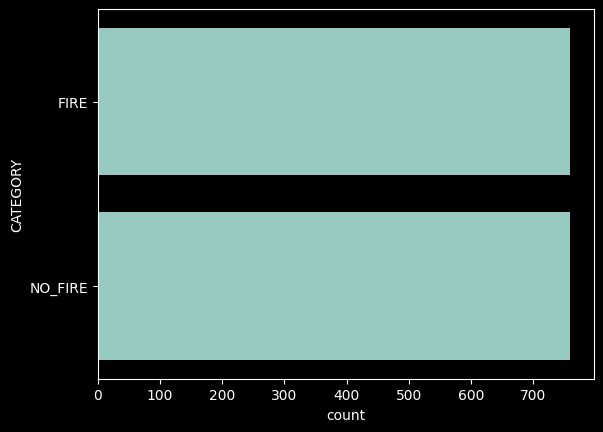

In [23]:
sns.countplot(Main_Train_Data["CATEGORY"])
plt.show()

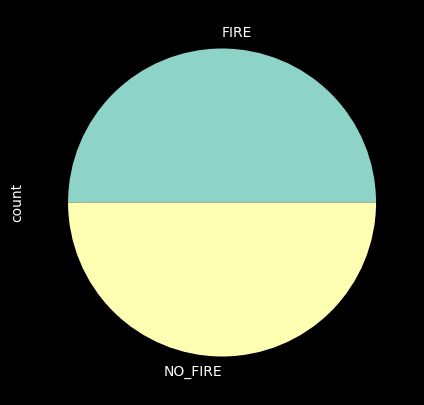

In [24]:
Main_Train_Data['CATEGORY'].value_counts().plot.pie(figsize=(5,5))
plt.show()

Text(0.5, 1.0, 'FIRE')

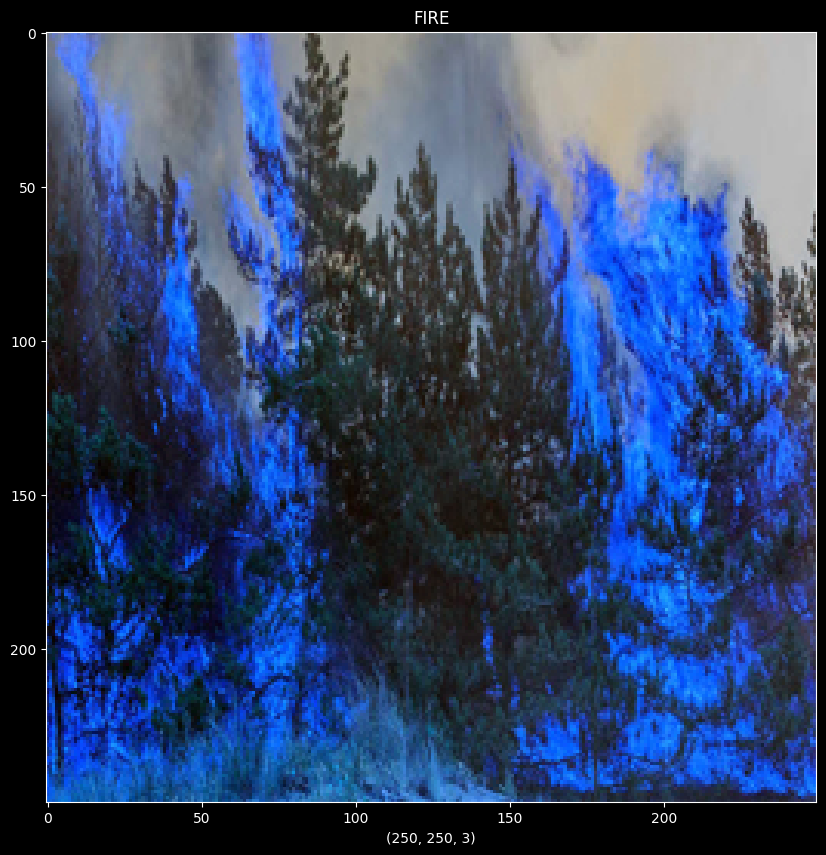

In [25]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["JPG"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][0])

Text(0.5, 1.0, 'NO_FIRE')

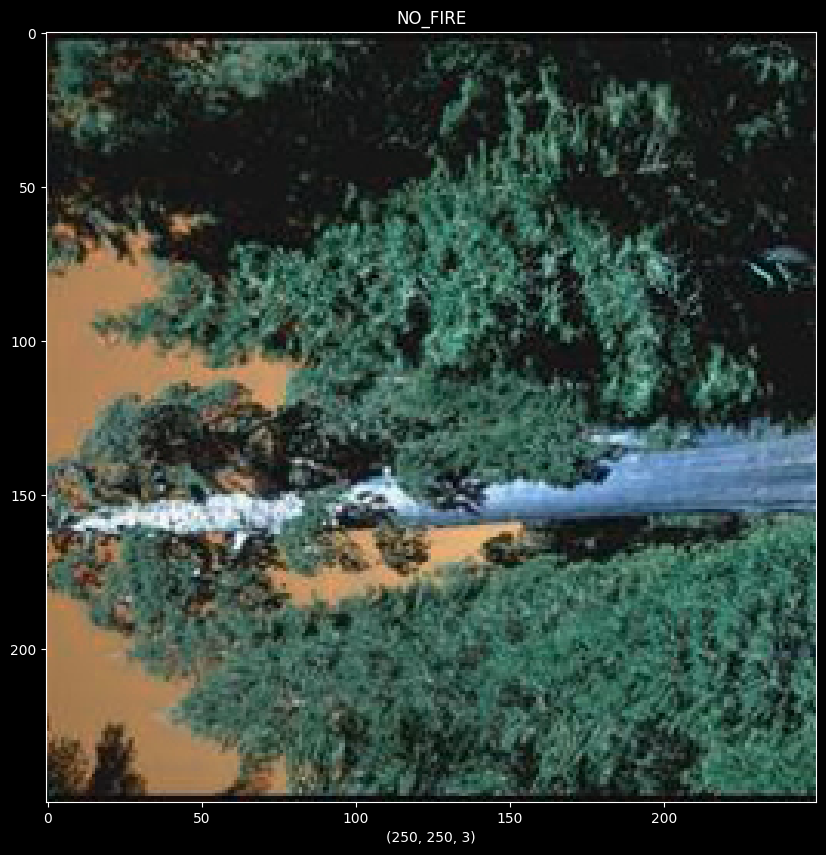

In [26]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["JPG"][994])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][994])

Text(0.5, 1.0, 'NO_FIRE')

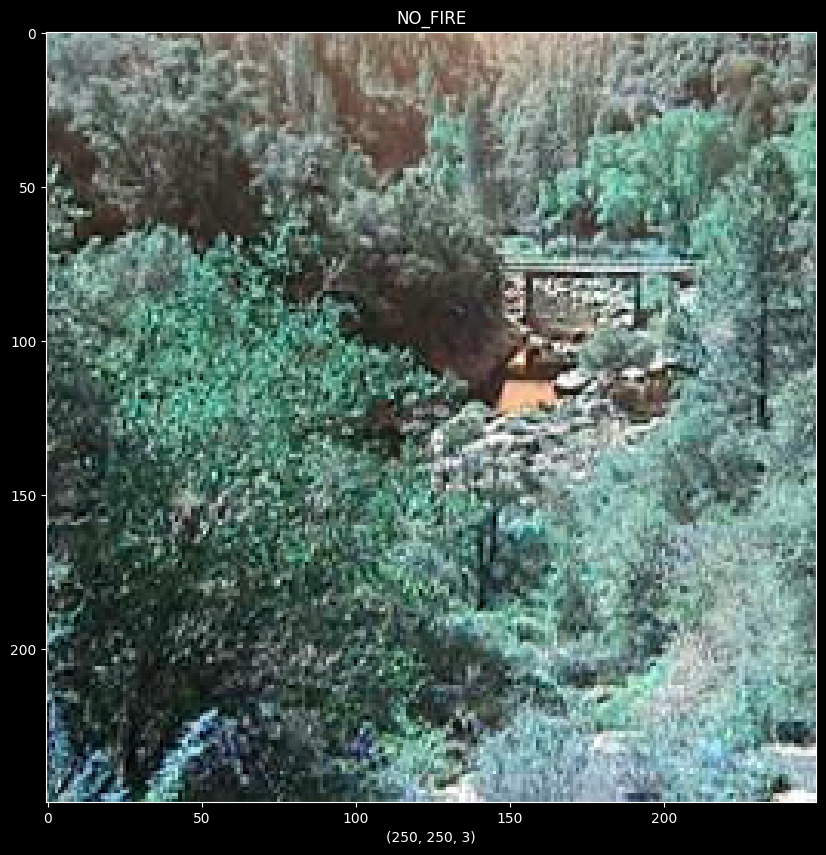

In [27]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["JPG"][20])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][20])

Text(0.5, 1.0, 'NO_FIRE')

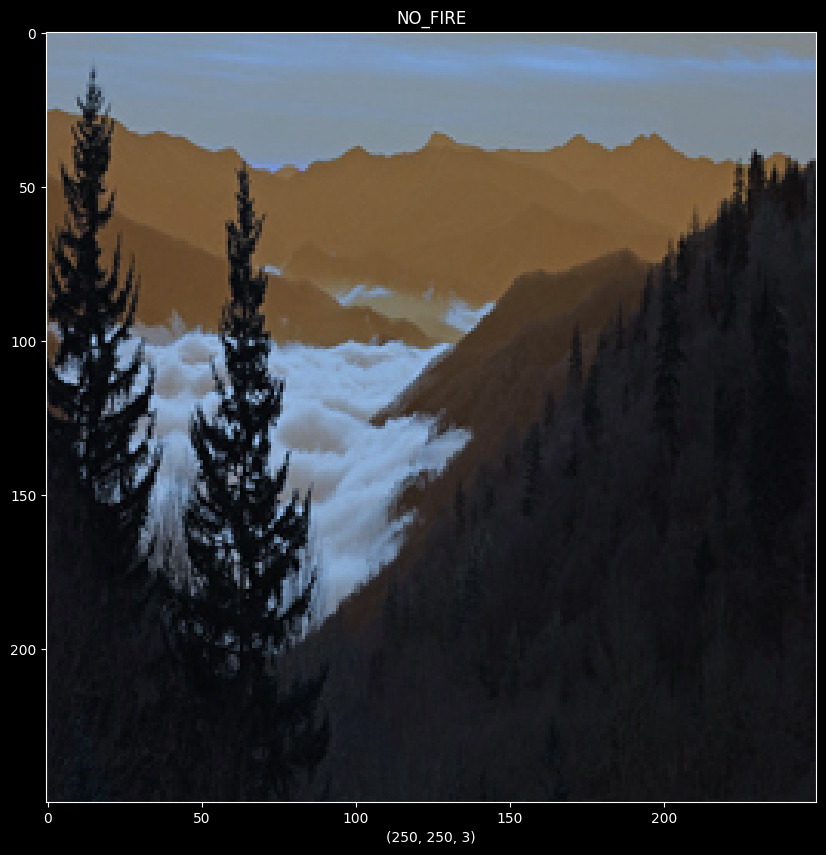

In [28]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["JPG"][45])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][45])

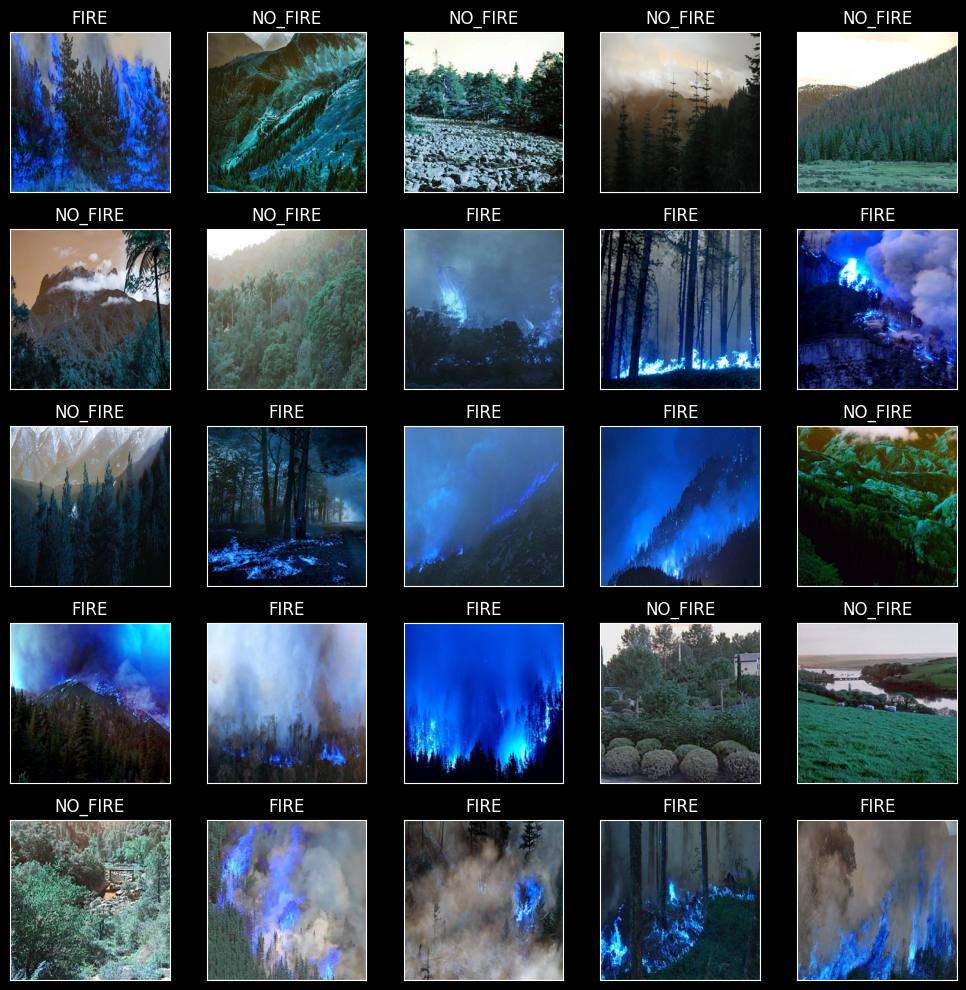

In [29]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Main_Train_Data["JPG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

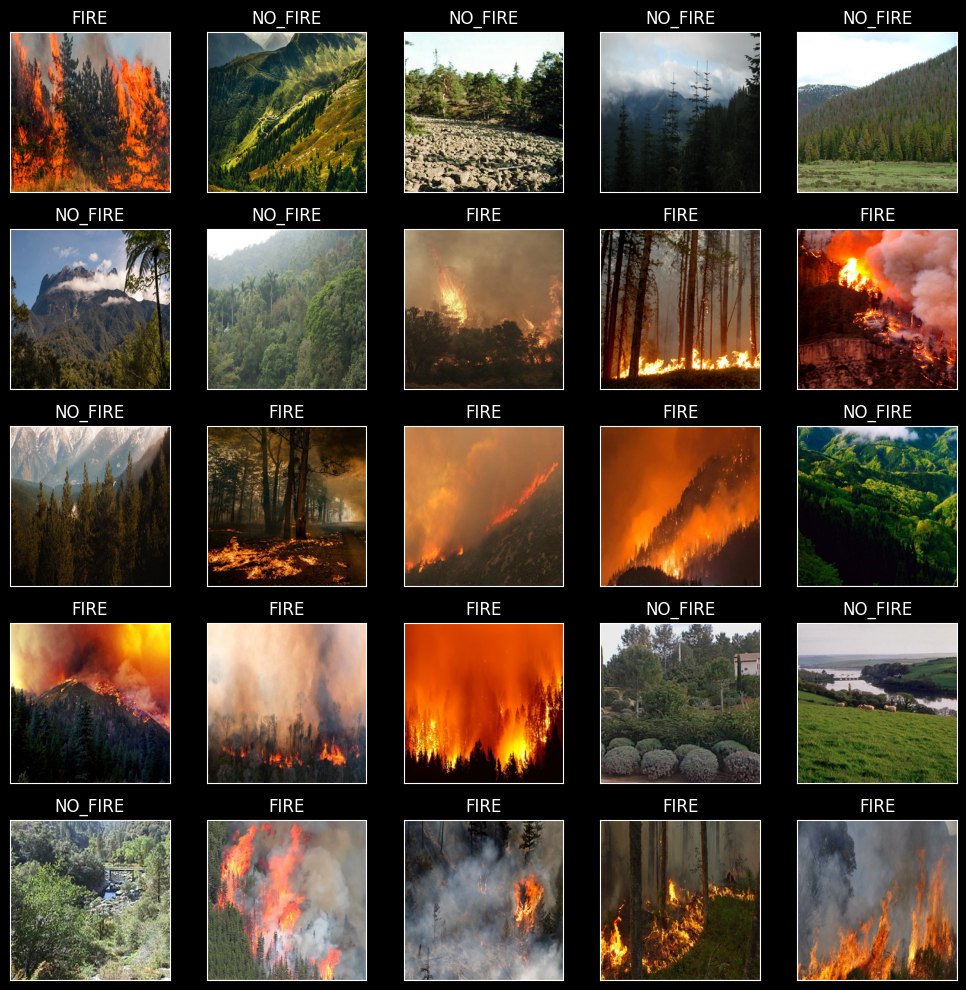

In [30]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    x = cv2.imread(Main_Train_Data["JPG"][i])
    x = cv2.cvtColor(x,cv2.COLOR_RGB2BGR)
    ax.imshow(x)
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

Train and Test Data

In [88]:
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    shear_range=0.3,
                                    zoom_range=0.2,
                                    brightness_range=[0.2,0.9],
                                    rotation_range=30,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    fill_mode="nearest",
                                    validation_split=0.1)

In [89]:
Test_Generator = ImageDataGenerator(rescale=1./255)

In [90]:
#Splitting Train and Test

Train_Data,Test_Data = train_test_split(Main_Train_Data,train_size=0.7,random_state=42,shuffle=True)

In [91]:
print("TRAIN SHAPE: ",Train_Data.shape)
print("TEST SHAPE: ",Test_Data.shape)

TRAIN SHAPE:  (1064, 2)
TEST SHAPE:  (456, 2)


In [92]:
print(Train_Data.head(-1))
print("----"*20)
print(Test_Data.head(-1))

                                               JPG CATEGORY
1374  fire_dataset\Training\nofire\nofire_0433.jpg  NO_FIRE
1149      fire_dataset\Training\fire\fire_0299.jpg     FIRE
355       fire_dataset\Training\fire\fire_0270.jpg     FIRE
1236      fire_dataset\Training\fire\fire_0154.jpg     FIRE
170       fire_dataset\Training\fire\fire_0625.jpg     FIRE
...                                            ...      ...
1095      fire_dataset\Training\fire\fire_0745.jpg     FIRE
1130      fire_dataset\Training\fire\fire_0148.jpg     FIRE
1294  fire_dataset\Training\nofire\nofire_0671.jpg  NO_FIRE
860   fire_dataset\Training\nofire\nofire_0602.jpg  NO_FIRE
1459  fire_dataset\Training\nofire\nofire_0584.jpg  NO_FIRE

[1063 rows x 2 columns]
--------------------------------------------------------------------------------
                                               JPG CATEGORY
461   fire_dataset\Training\nofire\nofire_0610.jpg  NO_FIRE
1314      fire_dataset\Training\fire\fire_0235.jpg    

In [93]:
print(Test_Data["CATEGORY"].value_counts())

CATEGORY
FIRE       242
NO_FIRE    214
Name: count, dtype: int64


In [94]:
encode = LabelEncoder()

In [95]:
For_Prediction_Class = encode.fit_transform(Test_Data["CATEGORY"])

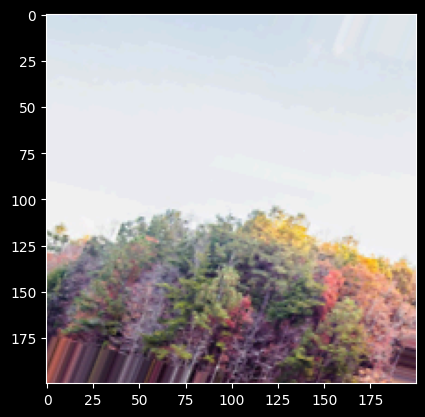

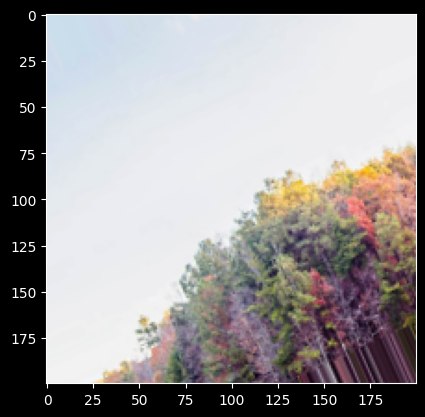

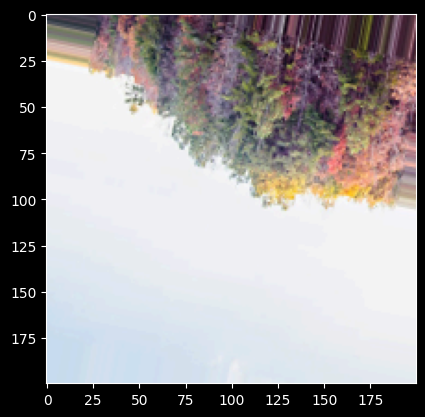

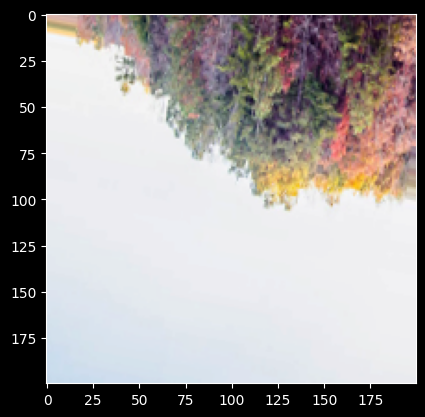

In [96]:
example_Image = Train_Data["JPG"][200]
Load_Image = image.load_img(example_Image,target_size=(200,200))
Array_Image = image.img_to_array(Load_Image)
Array_Image = Array_Image.reshape((1,) + Array_Image.shape)

i = 0
for batch in Train_Generator.flow(Array_Image,batch_size=1):
    plt.figure(i)
    IMG = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()

In [98]:
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="training")

Found 958 validated image filenames belonging to 2 classes.


In [99]:
Validation_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="validation")

Found 106 validated image filenames belonging to 2 classes.


In [100]:
Test_IMG_Set = Test_Generator.flow_from_dataframe(dataframe=Test_Data,
                                                 x_col="JPG",
                                                 y_col="CATEGORY",
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=32)

Found 456 validated image filenames belonging to 2 classes.


In [128]:
for data_batch, label_batch in Train_IMG_Set:
    print("DATA SHAPE: ", data_batch.shape)
    print("LABEL SHAPE: ", label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [102]:
for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [103]:
for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [105]:
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 1, 0, 0, 0]
(256, 256, 3)
------------------------------------------------------------
VALIDATION: 
{'FIRE': 0, 'NO_FIRE': 1}
[1, 0, 0, 0, 0]
(256, 256, 3)
------------------------------------------------------------
TEST: 
{'FIRE': 0, 'NO_FIRE': 1}
[1, 0, 0, 1, 0]
(256, 256, 3)


CNN

In [107]:
Model = Sequential()

Model.add(Conv2D(32,(3,3),activation="relu",
                 input_shape=(256,256,3)))
Model.add(BatchNormalization())
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(64,(3,3),
                 activation="relu",padding="same"))
Model.add(Dropout(0.2))
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(128,(3,3),
                 activation="relu",padding="same"))
Model.add(Dropout(0.5))
Model.add(MaxPooling2D((2,2)))


#
Model.add(Flatten())
Model.add(Dense(256,activation="relu"))
Model.add(Dropout(0.5))
Model.add(Dense(2,activation="softmax"))

In [108]:
Call_Back = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=5,mode="min")

In [109]:
Model.compile(optimizer="rmsprop",loss="categorical_crossentropy",metrics=["accuracy"])

In [110]:
CNN_Model = Model.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=Call_Back,
                      epochs=15)

Epoch 1/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.7204 - loss: 59.3181 - val_accuracy: 0.8585 - val_loss: 0.5520
Epoch 2/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - accuracy: 0.8786 - loss: 0.5587 - val_accuracy: 0.8962 - val_loss: 0.6418
Epoch 3/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.8979 - loss: 0.3101 - val_accuracy: 0.8962 - val_loss: 0.5946
Epoch 4/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.9106 - loss: 0.3071 - val_accuracy: 0.8585 - val_loss: 0.6052
Epoch 5/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - accuracy: 0.9133 - loss: 0.2870 - val_accuracy: 0.8679 - val_loss: 0.5792
Epoch 6/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.9089 - loss: 0.3348 - val_accuracy: 0.7830 - val_loss: 0.5741
Epoch 7/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9361 - loss: 0.2068 - val_accuracy: 0.8113 - val_loss: 0.5638
Epoch 8/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 2905s 2s/step - accuracy: 0.9226 - loss: 0.2614 - val_accuracy: 0.8868 - val_lo

In [111]:
print(Model.summary())

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 254, 254, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 127, 127, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 127, 127, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 63, 63, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 63, 63, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 63, 63, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 31, 31, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 123008)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │    31,490,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 63,168,326 (240.97 MB)

 Trainable params: 31,584,130 (120.48 MB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 31,584,132 (120.48 MB)

None


In [112]:
Model_Results = Model.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - accuracy: 0.9281 - loss: 0.3939
LOSS:  0.4020
ACCURACY:  0.93


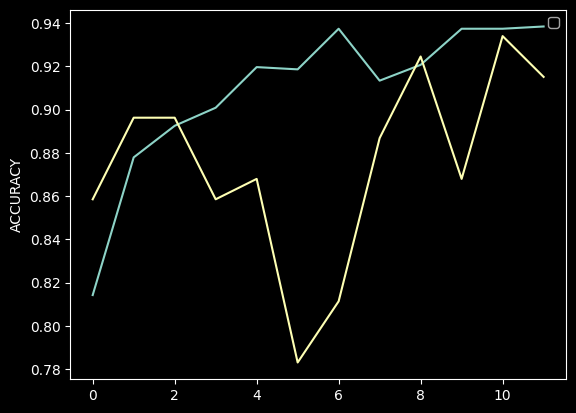

In [113]:
plt.plot(CNN_Model.history["accuracy"])
plt.plot(CNN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

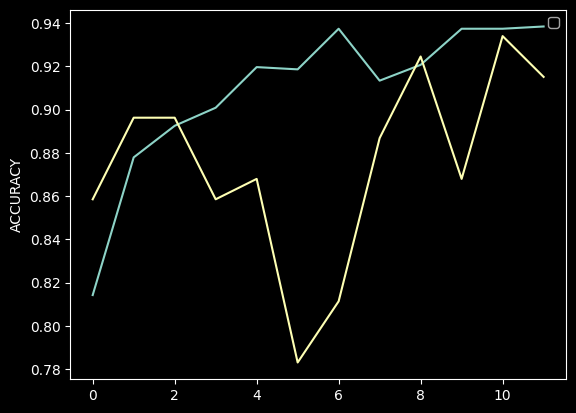

In [114]:
plt.plot(CNN_Model.history["accuracy"])
plt.plot(CNN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

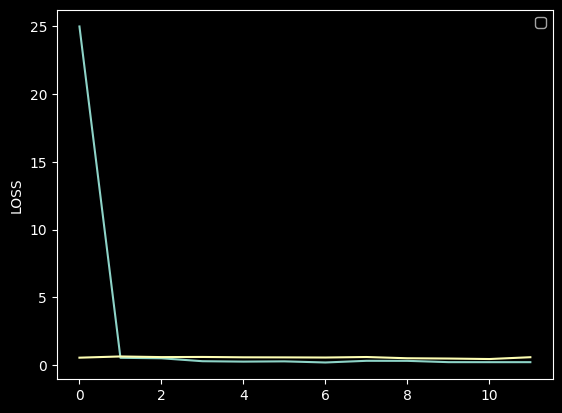

In [115]:
plt.plot(CNN_Model.history["loss"])
plt.plot(CNN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

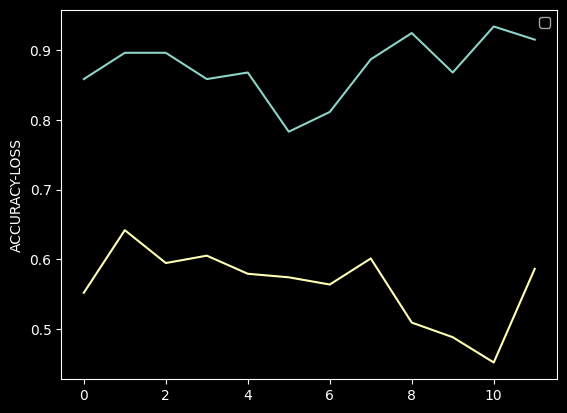

In [116]:
plt.plot(CNN_Model.history["val_accuracy"])
plt.plot(CNN_Model.history["val_loss"])
plt.ylabel("ACCURACY-LOSS")
plt.legend()
plt.show()

<Axes: >

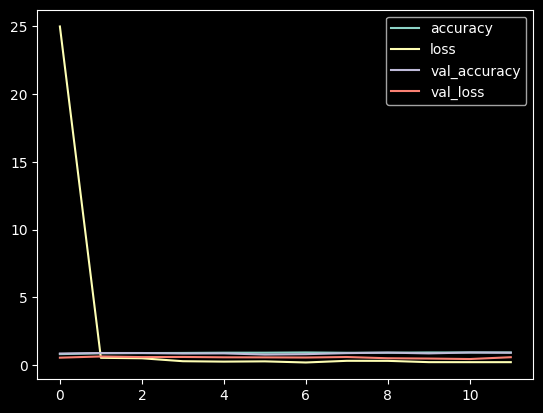

In [117]:
Dict_Summary_One = pd.DataFrame(CNN_Model.history)
Dict_Summary_One.plot()

Prediction

15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step


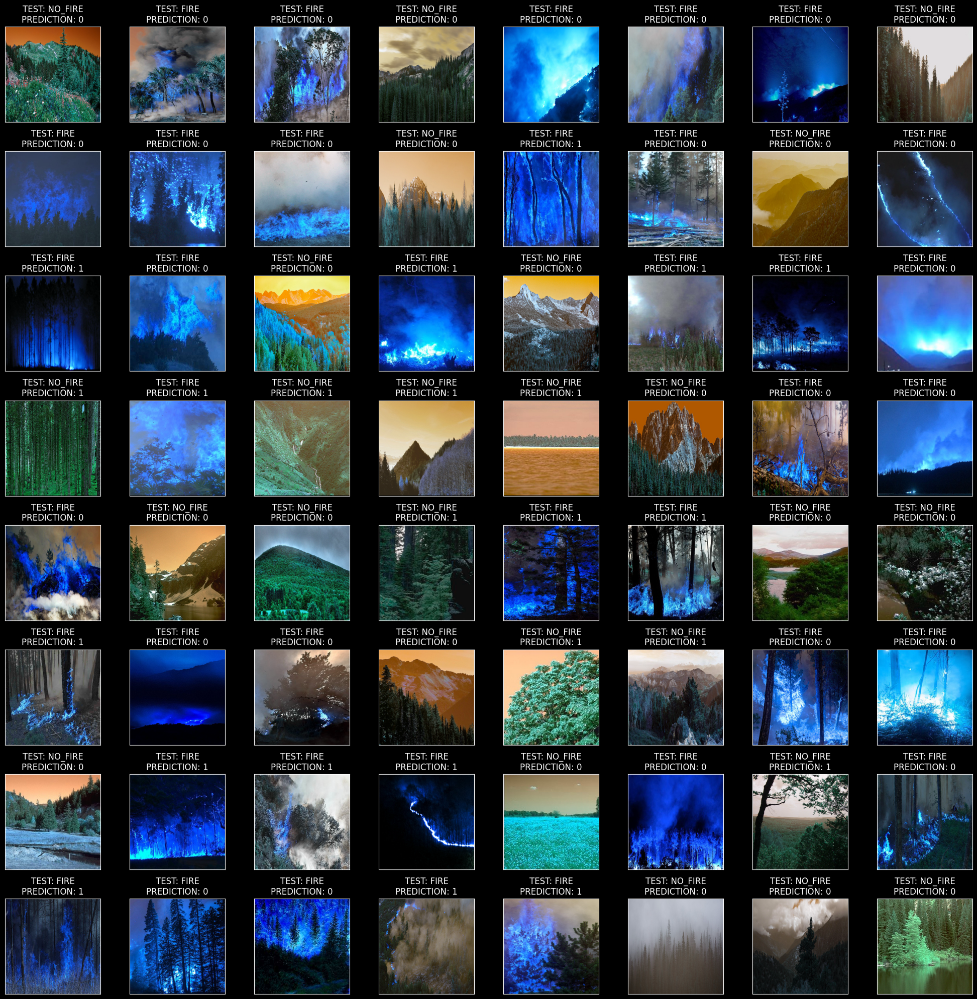

In [236]:
Prediction_One = Model.predict(Test_IMG_Set)
Prediction_One_binary = np.argmax(Prediction_One, axis=1)
fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Test_Data["JPG"].iloc[i]))
    ax.set_title(f"TEST: {Test_Data.CATEGORY.iloc[i]}\nPREDICTION: {Prediction_One_binary[i]}")
plt.tight_layout()
plt.show()

In [135]:
image_path = "fire_dataset/Testing/fire_0015.jpg"
img = image.load_img(image_path,target_size=(256,256))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
[0]


(-0.5, 255.5, 255.5, -0.5)

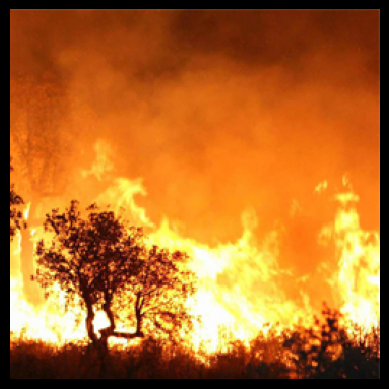

In [227]:
Diff_Pred = Model.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)
plt.imshow(img)
plt.axis('off')  

In [137]:
image_path_Two = "fire_dataset/Testing/nofire_0867.jpg"
img_Two = image.load_img(image_path_Two,target_size=(256,256))
x_Two = image.img_to_array(img_Two)
x_Two = np.expand_dims(x_Two,axis=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
[0]


(-0.5, 255.5, 255.5, -0.5)

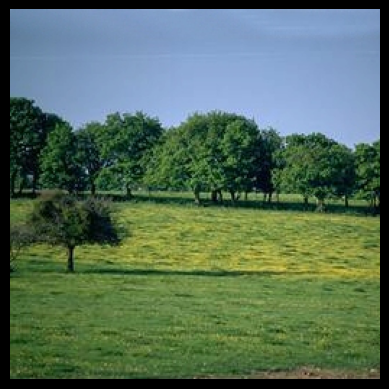

In [228]:
Diff_Pred_Two = Model.predict(x_Two)
Diff_Pred_Two = Diff_Pred_Two.argmax(axis=-1)
print(Diff_Pred_Two)
plt.imshow(img_Two)
plt.axis('off')  

Fully Connected

In [140]:
Model_Two = tf.keras.models.Sequential([
    # Input layer with Rescaling
    tf.keras.layers.Rescaling(1./255, input_shape=(256, 256, 3)),  
    
    # Flattening the input
    tf.keras.layers.Flatten(),
    
    # Hidden layers
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    
    # Output layer
    tf.keras.layers.Dense(2, activation='softmax')
])

In [141]:
Model_Two.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

In [143]:
ANN_Model = Model_Two.fit(Train_IMG_Set,
                          validation_data=Validation_IMG_Set,
                          callbacks=Call_Back,
                      epochs=100)

Epoch 1/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 23s 654ms/step - accuracy: 0.9067 - loss: 0.2480 - val_accuracy: 0.9057 - val_loss: 0.3945
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 16s 452ms/step - accuracy: 0.9076 - loss: 0.2569 - val_accuracy: 0.9340 - val_loss: 0.3590
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 16s 448ms/step - accuracy: 0.9312 - loss: 0.2423 - val_accuracy: 0.8962 - val_loss: 0.2799
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 17s 404ms/step - accuracy: 0.9423 - loss: 0.2131 - val_accuracy: 0.9623 - val_loss: 0.3132
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 17s 412ms/step - accuracy: 0.9263 - loss: 0.1878 - val_accuracy: 0.8679 - val_loss: 0.4734
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 14s 400ms/step - accuracy: 0.9157 - loss: 0.2352 - val_accuracy: 0.9340 - val_loss: 0.3669
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 19s 515ms/step - accuracy: 0.9360 - loss: 0.1913 - val_accuracy: 0.9528 - val_loss: 0.2498
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 23s 619ms/step - accuracy: 0.9413 - loss: 0.1737 - 

In [144]:
print(Model_Two.summary())

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 196608)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │    25,165,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 75,523,016 (288.10 MB)

 Trainable params: 25,174,338 (96.03 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 50,348,678 (192.06 MB)

None


In [145]:
Model_Results_Two = Model_Two.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results_Two[0])
print("ACCURACY:  " + "%.2f" % Model_Results_Two[1])

15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 277ms/step - accuracy: 0.9625 - loss: 0.1348
LOSS:  0.1475
ACCURACY:  0.95


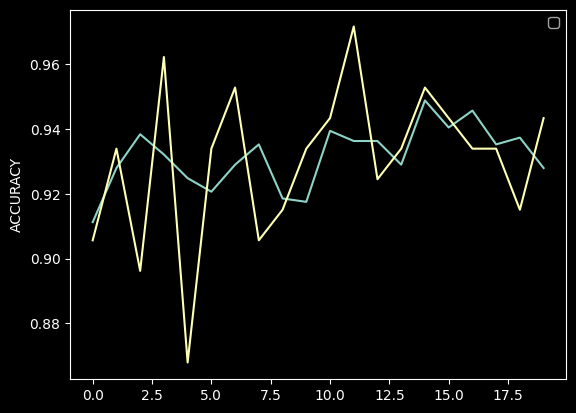

In [146]:
plt.plot(ANN_Model.history["accuracy"])
plt.plot(ANN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

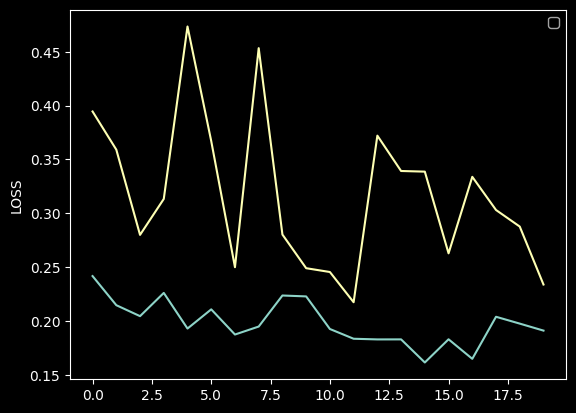

In [147]:
plt.plot(ANN_Model.history["loss"])
plt.plot(ANN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

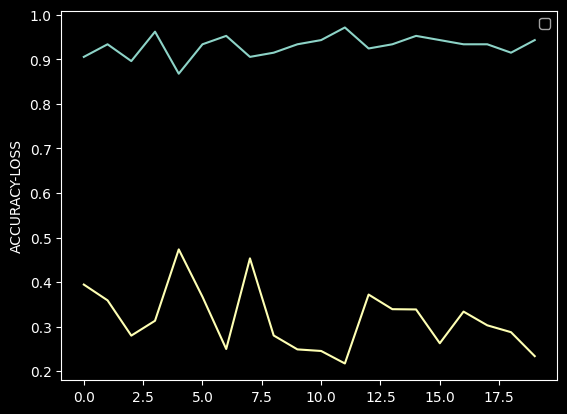

In [148]:
plt.plot(ANN_Model.history["val_accuracy"])
plt.plot(ANN_Model.history["val_loss"])
plt.ylabel("ACCURACY-LOSS")
plt.legend()
plt.show()

<Axes: >

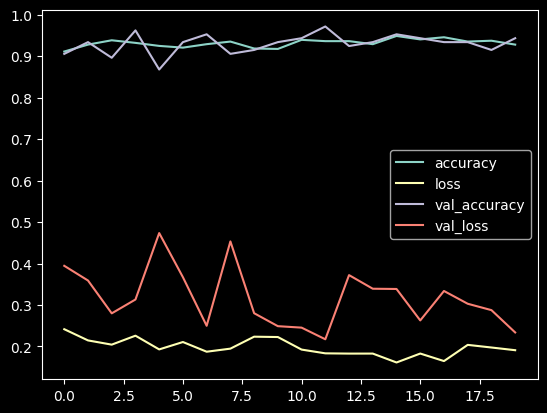

In [149]:
Dict_Summary_Two = pd.DataFrame(ANN_Model.history)
Dict_Summary_Two.plot()

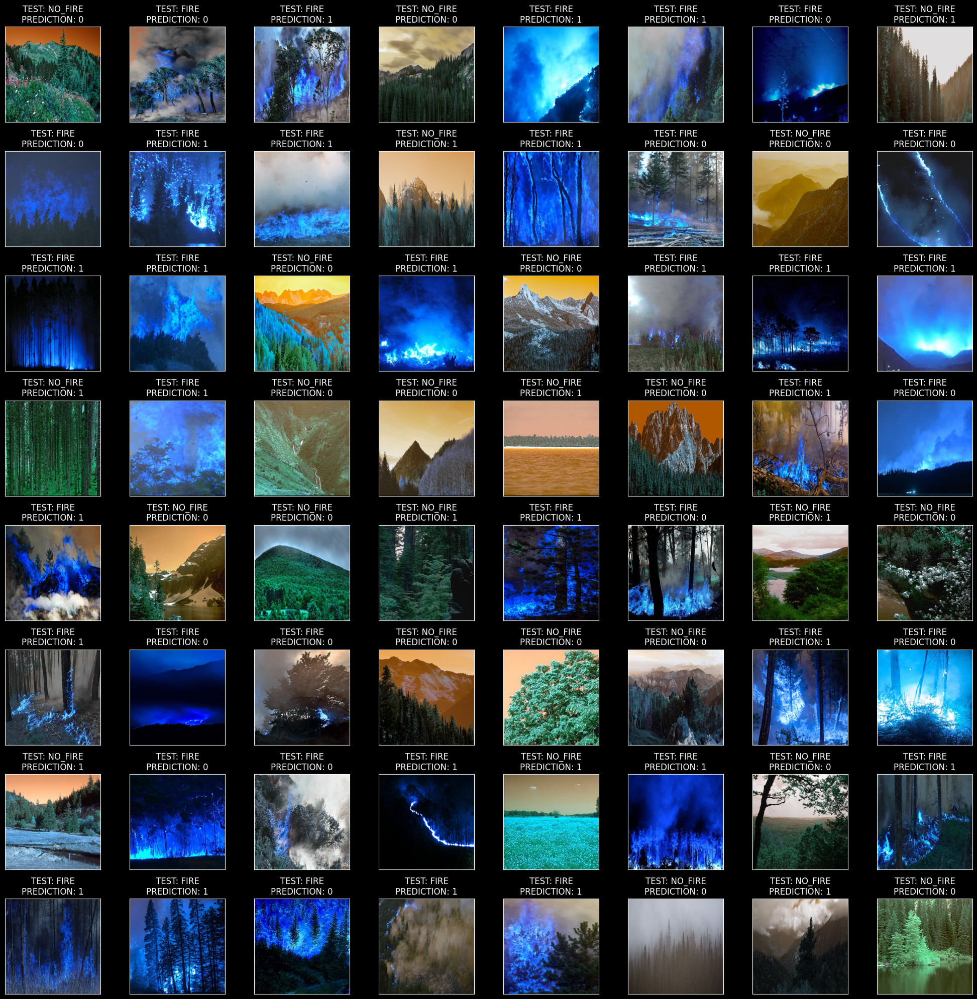

In [186]:
fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Test_Data["JPG"].iloc[i]))
    ax.set_title(f"TEST: {Test_Data.CATEGORY.iloc[i]}\nPREDICTION: {Predict_Class[i]}")
plt.tight_layout()
plt.show()

In [191]:
image_path = "fire_dataset/Testing/fire_0634.jpg"
img = image.load_img(image_path,target_size=(256,256))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
[0]


(-0.5, 255.5, 255.5, -0.5)

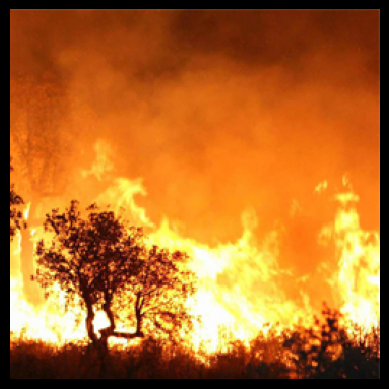

In [226]:
Diff_Pred = Model_Two.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)
plt.imshow(img)
plt.axis('off')  

In [193]:
image_path_Two = "fire_dataset/Testing/nofire_0911.jpg"
img_Two = image.load_img(image_path_Two,target_size=(256,256))
x_Two = image.img_to_array(img_Two)
x_Two = np.expand_dims(x_Two,axis=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
[1]


(-0.5, 255.5, 255.5, -0.5)

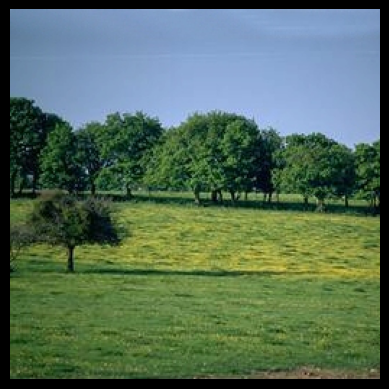

In [225]:
Diff_Pred_Two = Model_Two.predict(x_Two)
Diff_Pred_Two = Diff_Pred_Two.argmax(axis=-1)
print(Diff_Pred_Two)
plt.imshow(img_Two)
plt.axis('off')  